In [1]:
#impoting the Necessary libraries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Loading the datasets

In [3]:
life_expectancy_data = pd.read_csv('life_expectancy.csv')
fertility_rate_data = pd.read_csv('fertility_rate.csv')
country_population_data = pd.read_csv('country_population.csv')
country_data = pd.read_csv('Metadata_Country.csv')

# Cleaning the dataset_1 - life_expectancy_data

In [4]:
df1=pd.DataFrame(life_expectancy_data)
df1.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,Aruba,ABW,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,65.662,66.074,66.444,66.787,67.113,67.435,...,74.576,74.725,74.872,75.016,75.158,75.299,75.440,75.582,75.725,75.867
1,Afghanistan,AFG,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,32.292,32.742,33.185,33.624,34.060,34.495,...,59.694,60.243,60.754,61.226,61.666,62.086,62.494,62.895,63.288,63.673
2,Angola,AGO,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,33.251,33.573,33.914,34.272,34.645,35.031,...,55.096,56.189,57.231,58.192,59.042,59.770,60.373,60.858,61.241,61.547
3,Albania,ALB,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,62.279,63.298,64.187,64.911,65.461,65.848,...,75.656,75.943,76.281,76.652,77.031,77.389,77.702,77.963,78.174,78.345
4,Andorra,AND,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Handling the Missing Values  for the life_expectancy_data

In [5]:
#Finding the no of missing values for the life_expectancy_data
df1.isnull().sum()

Country Name       0
Country Code       0
Indicator Name     0
Indicator Code     0
1960              29
                  ..
2012              17
2013              19
2014              19
2015              20
2016              19
Length: 61, dtype: int64

In [6]:
# Generating a list of column names from '1960' to '2016'
years_to_fill = [str(year) for year in range(1960, 2017)]

#Filling the missing values with the mean
for year in years_to_fill:
    mean_year = df1[year].mean()  # Calculate the mean of the column
    df1[year].fillna(mean_year, inplace=True)  # Fill missing values with the calculated mean


In [7]:
# Generating a list of column names from '1960' to '2016'
years_to_round = [str(year) for year in range(1960, 2017)]

#rounding off the decimal values

for year in years_to_round:
    df1[year] = df1[year].round(2)  # Round the values in each column to two decimal places


In [8]:
#verifying if the null values is been replaced
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 264 entries, 0 to 263
Data columns (total 61 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Country Name    264 non-null    object 
 1   Country Code    264 non-null    object 
 2   Indicator Name  264 non-null    object 
 3   Indicator Code  264 non-null    object 
 4   1960            264 non-null    float64
 5   1961            264 non-null    float64
 6   1962            264 non-null    float64
 7   1963            264 non-null    float64
 8   1964            264 non-null    float64
 9   1965            264 non-null    float64
 10  1966            264 non-null    float64
 11  1967            264 non-null    float64
 12  1968            264 non-null    float64
 13  1969            264 non-null    float64
 14  1970            264 non-null    float64
 15  1971            264 non-null    float64
 16  1972            264 non-null    float64
 17  1973            264 non-null    flo

##  Checking for the duplicated_rows

In [9]:
df1.duplicated().sum()

0

## Checking the datatypes of the columns 

In [10]:
df1.dtypes

Country Name       object
Country Code       object
Indicator Name     object
Indicator Code     object
1960              float64
                   ...   
2012              float64
2013              float64
2014              float64
2015              float64
2016              float64
Length: 61, dtype: object

In [11]:
df1['Country Name'].unique()

array(['Aruba', 'Afghanistan', 'Angola', 'Albania', 'Andorra',
       'Arab World', 'United Arab Emirates', 'Argentina', 'Armenia',
       'American Samoa', 'Antigua and Barbuda', 'Australia', 'Austria',
       'Azerbaijan', 'Burundi', 'Belgium', 'Benin', 'Burkina Faso',
       'Bangladesh', 'Bulgaria', 'Bahrain', 'Bahamas, The',
       'Bosnia and Herzegovina', 'Belarus', 'Belize', 'Bermuda',
       'Bolivia', 'Brazil', 'Barbados', 'Brunei Darussalam', 'Bhutan',
       'Botswana', 'Central African Republic', 'Canada',
       'Central Europe and the Baltics', 'Switzerland', 'Channel Islands',
       'Chile', 'China', "Cote d'Ivoire", 'Cameroon', 'Congo, Dem. Rep.',
       'Congo, Rep.', 'Colombia', 'Comoros', 'Cabo Verde', 'Costa Rica',
       'Caribbean small states', 'Cuba', 'Curacao', 'Cayman Islands',
       'Cyprus', 'Czech Republic', 'Germany', 'Djibouti', 'Dominica',
       'Denmark', 'Dominican Republic', 'Algeria',
       'East Asia & Pacific (excluding high income)',
       '

In [12]:
#Removing the row where the country name="Not classified"

not_classified=df1[df1['Country Name']== 'Not Classified'].index

df1=df1.drop(not_classified)

In [13]:
df1

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,Aruba,ABW,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,65.66,66.07,66.44,66.79,67.11,67.44,...,74.58,74.72,74.87,75.02,75.16,75.30,75.44,75.58,75.72,75.87
1,Afghanistan,AFG,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,32.29,32.74,33.18,33.62,34.06,34.49,...,59.69,60.24,60.75,61.23,61.67,62.09,62.49,62.90,63.29,63.67
2,Angola,AGO,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,33.25,33.57,33.91,34.27,34.65,35.03,...,55.10,56.19,57.23,58.19,59.04,59.77,60.37,60.86,61.24,61.55
3,Albania,ALB,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,62.28,63.30,64.19,64.91,65.46,65.85,...,75.66,75.94,76.28,76.65,77.03,77.39,77.70,77.96,78.17,78.34
4,Andorra,AND,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,53.37,53.92,54.31,54.69,55.18,55.67,...,69.16,69.54,69.93,70.28,70.63,70.99,71.23,71.55,71.75,71.99
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259,Kosovo,XKX,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,53.37,53.92,54.31,54.69,55.18,55.67,...,69.20,69.40,69.65,69.90,70.15,70.50,70.80,71.10,71.35,71.65
260,"Yemen, Rep.",YEM,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,34.36,34.47,34.74,35.19,35.82,36.60,...,62.55,62.89,63.21,63.51,63.79,64.05,64.29,64.52,64.74,64.95
261,South Africa,ZAF,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,52.22,52.56,52.89,53.23,53.57,53.93,...,53.01,53.72,54.70,55.89,57.20,58.54,59.83,60.99,61.98,62.77
262,Zambia,ZMB,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,45.12,45.50,45.87,46.22,46.57,46.93,...,52.31,53.75,55.19,56.59,57.87,59.01,59.98,60.78,61.40,61.87


In [14]:
df1['Country Code'].unique()

array(['ABW', 'AFG', 'AGO', 'ALB', 'AND', 'ARB', 'ARE', 'ARG', 'ARM',
       'ASM', 'ATG', 'AUS', 'AUT', 'AZE', 'BDI', 'BEL', 'BEN', 'BFA',
       'BGD', 'BGR', 'BHR', 'BHS', 'BIH', 'BLR', 'BLZ', 'BMU', 'BOL',
       'BRA', 'BRB', 'BRN', 'BTN', 'BWA', 'CAF', 'CAN', 'CEB', 'CHE',
       'CHI', 'CHL', 'CHN', 'CIV', 'CMR', 'COD', 'COG', 'COL', 'COM',
       'CPV', 'CRI', 'CSS', 'CUB', 'CUW', 'CYM', 'CYP', 'CZE', 'DEU',
       'DJI', 'DMA', 'DNK', 'DOM', 'DZA', 'EAP', 'EAR', 'EAS', 'ECA',
       'ECS', 'ECU', 'EGY', 'EMU', 'ERI', 'ESP', 'EST', 'ETH', 'EUU',
       'FCS', 'FIN', 'FJI', 'FRA', 'FRO', 'FSM', 'GAB', 'GBR', 'GEO',
       'GHA', 'GIB', 'GIN', 'GMB', 'GNB', 'GNQ', 'GRC', 'GRD', 'GRL',
       'GTM', 'GUM', 'GUY', 'HIC', 'HKG', 'HND', 'HPC', 'HRV', 'HTI',
       'HUN', 'IBD', 'IBT', 'IDA', 'IDB', 'IDN', 'IDX', 'IMN', 'IND',
       'INX', 'IRL', 'IRN', 'IRQ', 'ISL', 'ISR', 'ITA', 'JAM', 'JOR',
       'JPN', 'KAZ', 'KEN', 'KGZ', 'KHM', 'KIR', 'KNA', 'KOR', 'KWT',
       'LAC', 'LAO',

In [15]:
df1['Indicator Code'].nunique()

1

In [16]:
df1['Indicator Name'].unique()

array(['Life expectancy at birth, total (years)'], dtype=object)

In [17]:
#Dropping the Indicator Code column
df1.drop('Indicator Code', axis=1, inplace=True)

In [18]:
#Dropping the Indicator Name column
df1.drop('Indicator Name' , axis =1 ,inplace =True)

In [19]:
df1.head()

,Country Name,Country Code,1960,1961,1962,1963,1964,1965,1966,1967,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,Aruba,ABW,65.66,66.07,66.44,66.79,67.11,67.44,67.76,68.10,...,74.58,74.72,74.87,75.02,75.16,75.30,75.44,75.58,75.72,75.87
1,Afghanistan,AFG,32.29,32.74,33.18,33.62,34.06,34.49,34.93,35.36,...,59.69,60.24,60.75,61.23,61.67,62.09,62.49,62.90,63.29,63.67
2,Angola,AGO,33.25,33.57,33.91,34.27,34.65,35.03,35.43,35.83,...,55.10,56.19,57.23,58.19,59.04,59.77,60.37,60.86,61.24,61.55
3,Albania,ALB,62.28,63.30,64.19,64.91,65.46,65.85,66.11,66.30,...,75.66,75.94,76.28,76.65,77.03,77.39,77.70,77.96,78.17,78.34
4,Andorra,AND,53.37,53.92,54.31,54.69,55.18,55.67,56.14,56.56,...,69.16,69.54,69.93,70.28,70.63,70.99,71.23,71.55,71.75,71.99


# Cleaning the dataset2 - Fertility_rate_data

In [20]:
df2=pd.DataFrame(fertility_rate_data)
df2.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,Aruba,ABW,"Fertility rate, total (births per woman)",SP.DYN.TFRT.IN,4.820,4.655,4.471,4.271,4.059,3.842,...,1.763,1.764,1.769,1.776,1.783,1.791,1.796,1.800,1.801,1.800
1,Afghanistan,AFG,"Fertility rate, total (births per woman)",SP.DYN.TFRT.IN,7.450,7.450,7.450,7.450,7.450,7.450,...,6.460,6.254,6.038,5.816,5.595,5.380,5.174,4.981,4.802,4.635
2,Angola,AGO,"Fertility rate, total (births per woman)",SP.DYN.TFRT.IN,7.478,7.524,7.563,7.592,7.611,7.619,...,6.368,6.307,6.238,6.162,6.082,6.000,5.920,5.841,5.766,5.694
3,Albania,ALB,"Fertility rate, total (births per woman)",SP.DYN.TFRT.IN,6.489,6.401,6.282,6.133,5.960,5.773,...,1.668,1.650,1.646,1.653,1.668,1.685,1.700,1.710,1.714,1.713
4,Andorra,AND,"Fertility rate, total (births per woman)",SP.DYN.TFRT.IN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.180,1.250,1.190,1.270,NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
#Removing the row where the country name  is "Not classified"

not_classified=df2[df2['Country Name']== 'Not Classified'].index

df2=df2.drop(not_classified)

## Handling the Missing Values for the fertility_rate_data¶

In [22]:
#Finding the no of missing values for the fertility_rate_data
df2.isnull().sum()

Country Name       0
Country Code       0
Indicator Name     0
Indicator Code     0
1960              28
                  ..
2012              16
2013              18
2014              18
2015              17
2016              18
Length: 61, dtype: int64

In [23]:
# Generating a list of column names from '1960' to '2016'
years_to_fill = [str(year) for year in range(1960, 2017)]

#Filling the missing values with the mean
for year in years_to_fill:
    mean_year = df2[year].mean()  # Calculate the mean of the column
    df2[year].fillna(mean_year, inplace=True)  # Fill missing values with the calculated mean


In [24]:
# Generating a list of column names from '1960' to '2016'
years_to_round = [str(year) for year in range(1960, 2017)]

#rounding off the decimal values

for year in years_to_round:
    df2[year] = df2[year].round(2)  # Round the values in each column to two decimal places


In [25]:
#verifying if the null values is been replaced
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 264 entries, 0 to 263
Data columns (total 61 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Country Name    264 non-null    object 
 1   Country Code    264 non-null    object 
 2   Indicator Name  264 non-null    object 
 3   Indicator Code  264 non-null    object 
 4   1960            264 non-null    float64
 5   1961            264 non-null    float64
 6   1962            264 non-null    float64
 7   1963            264 non-null    float64
 8   1964            264 non-null    float64
 9   1965            264 non-null    float64
 10  1966            264 non-null    float64
 11  1967            264 non-null    float64
 12  1968            264 non-null    float64
 13  1969            264 non-null    float64
 14  1970            264 non-null    float64
 15  1971            264 non-null    float64
 16  1972            264 non-null    float64
 17  1973            264 non-null    flo

##  Checking for the duplicated_rows

In [26]:
df2.duplicated().sum()

0

## Checking the datatypes of the columns

In [27]:
df2.dtypes

Country Name       object
Country Code       object
Indicator Name     object
Indicator Code     object
1960              float64
                   ...   
2012              float64
2013              float64
2014              float64
2015              float64
2016              float64
Length: 61, dtype: object

In [28]:
#Dropping the Indicator Code column
df2.drop('Indicator Code', axis=1, inplace=True)

#Dropping the Indicator Name column
df2.drop('Indicator Name' , axis =1 ,inplace =True)

In [29]:
df2.head()

,Country Name,Country Code,1960,1961,1962,1963,1964,1965,1966,1967,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,Aruba,ABW,4.82,4.66,4.47,4.27,4.06,3.84,3.62,3.42,...,1.76,1.76,1.77,1.78,1.78,1.79,1.80,1.80,1.80,1.80
1,Afghanistan,AFG,7.45,7.45,7.45,7.45,7.45,7.45,7.45,7.45,...,6.46,6.25,6.04,5.82,5.60,5.38,5.17,4.98,4.80,4.64
2,Angola,AGO,7.48,7.52,7.56,7.59,7.61,7.62,7.62,7.61,...,6.37,6.31,6.24,6.16,6.08,6.00,5.92,5.84,5.77,5.69
3,Albania,ALB,6.49,6.40,6.28,6.13,5.96,5.77,5.58,5.39,...,1.67,1.65,1.65,1.65,1.67,1.68,1.70,1.71,1.71,1.71
4,Andorra,AND,5.51,5.49,5.50,5.50,5.46,5.42,5.37,5.33,...,1.18,1.25,1.19,1.27,2.88,2.84,2.82,2.79,2.76,2.73


# Cleaning the dataset3 - country_population_data

In [30]:
df3=pd.DataFrame(country_population_data)
df3.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,Aruba,ABW,"Population, total",SP.POP.TOTL,54211.0,55438.0,56225.0,56695.0,57032.0,57360.0,...,101220.0,101353.0,101453.0,101669.0,102053.0,102577.0,103187.0,103795.0,104341.0,104822.0
1,Afghanistan,AFG,"Population, total",SP.POP.TOTL,8996351.0,9166764.0,9345868.0,9533954.0,9731361.0,9938414.0,...,26616792.0,27294031.0,28004331.0,28803167.0,29708599.0,30696958.0,31731688.0,32758020.0,33736494.0,34656032.0
2,Angola,AGO,"Population, total",SP.POP.TOTL,5643182.0,5753024.0,5866061.0,5980417.0,6093321.0,6203299.0,...,20997687.0,21759420.0,22549547.0,23369131.0,24218565.0,25096150.0,25998340.0,26920466.0,27859305.0,28813463.0
3,Albania,ALB,"Population, total",SP.POP.TOTL,1608800.0,1659800.0,1711319.0,1762621.0,1814135.0,1864791.0,...,2970017.0,2947314.0,2927519.0,2913021.0,2905195.0,2900401.0,2895092.0,2889104.0,2880703.0,2876101.0
4,Andorra,AND,"Population, total",SP.POP.TOTL,13411.0,14375.0,15370.0,16412.0,17469.0,18549.0,...,82683.0,83861.0,84462.0,84449.0,83751.0,82431.0,80788.0,79223.0,78014.0,77281.0


In [31]:
#Removing the row where the country name="Not classified"

not_classified=df3[df3['Country Name']== 'Not Classified'].index

df3=df3.drop(not_classified)

## Handling the Missing Values for the country_population_data¶

In [32]:
#Finding the no of missing values 
df3.isnull().sum()

Country Name      0
Country Code      0
Indicator Name    0
Indicator Code    0
1960              4
                 ..
2012              2
2013              2
2014              2
2015              2
2016              2
Length: 61, dtype: int64

In [33]:
# Generating a list of column names from '1960' to '2016'
years_to_fill = [str(year) for year in range(1960, 2017)]

#Filling the missing values with the median
for year in years_to_fill:
    median_year = df3[year].median()  # Calculate the mean of the column
    df3[year].fillna(median_year, inplace=True)  # Fill missing values with the calculated mean


In [34]:
# Generating a list of column names from '1960' to '2016'
years_to_round = [str(year) for year in range(1960, 2017)]

#rounding off the decimal values

for year in years_to_round:
    df3[year] = df3[year].round(2)  # Round the values in each column to two decimal places


In [35]:
#verifying if the null values is been replaced
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 264 entries, 0 to 263
Data columns (total 61 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Country Name    264 non-null    object 
 1   Country Code    264 non-null    object 
 2   Indicator Name  264 non-null    object 
 3   Indicator Code  264 non-null    object 
 4   1960            264 non-null    float64
 5   1961            264 non-null    float64
 6   1962            264 non-null    float64
 7   1963            264 non-null    float64
 8   1964            264 non-null    float64
 9   1965            264 non-null    float64
 10  1966            264 non-null    float64
 11  1967            264 non-null    float64
 12  1968            264 non-null    float64
 13  1969            264 non-null    float64
 14  1970            264 non-null    float64
 15  1971            264 non-null    float64
 16  1972            264 non-null    float64
 17  1973            264 non-null    flo

## Checking for the duplicated_rows¶

In [36]:
df3.duplicated().sum()

0

## Checking the datatypes of the columns

In [37]:
df3.dtypes

Country Name       object
Country Code       object
Indicator Name     object
Indicator Code     object
1960              float64
                   ...   
2012              float64
2013              float64
2014              float64
2015              float64
2016              float64
Length: 61, dtype: object

In [38]:
#Dropping the Indicator Code column
df3.drop('Indicator Code', axis=1, inplace=True)

#Dropping the Indicator Name column
df3.drop('Indicator Name' , axis =1 ,inplace =True)

In [39]:
df3.head()

,Country Name,Country Code,1960,1961,1962,1963,1964,1965,1966,1967,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,Aruba,ABW,54211.0,55438.0,56225.0,56695.0,57032.0,57360.0,57715.0,58055.0,...,101220.0,101353.0,101453.0,101669.0,102053.0,102577.0,103187.0,103795.0,104341.0,104822.0
1,Afghanistan,AFG,8996351.0,9166764.0,9345868.0,9533954.0,9731361.0,9938414.0,10152331.0,10372630.0,...,26616792.0,27294031.0,28004331.0,28803167.0,29708599.0,30696958.0,31731688.0,32758020.0,33736494.0,34656032.0
2,Angola,AGO,5643182.0,5753024.0,5866061.0,5980417.0,6093321.0,6203299.0,6309770.0,6414995.0,...,20997687.0,21759420.0,22549547.0,23369131.0,24218565.0,25096150.0,25998340.0,26920466.0,27859305.0,28813463.0
3,Albania,ALB,1608800.0,1659800.0,1711319.0,1762621.0,1814135.0,1864791.0,1914573.0,1965598.0,...,2970017.0,2947314.0,2927519.0,2913021.0,2905195.0,2900401.0,2895092.0,2889104.0,2880703.0,2876101.0
4,Andorra,AND,13411.0,14375.0,15370.0,16412.0,17469.0,18549.0,19647.0,20758.0,...,82683.0,83861.0,84462.0,84449.0,83751.0,82431.0,80788.0,79223.0,78014.0,77281.0


# Cleaning the dataset4-metadata_country

In [40]:
df4=pd.DataFrame(country_data)
df4.head()

,Country Code,Region,IncomeGroup,SpecialNotes,TableName,Unnamed: 5
0,ABW,Latin America & Caribbean,High income,SNA data for 2000-2011 are updated from offici...,Aruba,NaN
1,AFG,South Asia,Low income,Fiscal year end: March 20; reporting period fo...,Afghanistan,NaN
2,AGO,Sub-Saharan Africa,Lower middle income,NaN,Angola,NaN
3,ALB,Europe & Central Asia,Upper middle income,NaN,Albania,NaN
4,AND,Europe & Central Asia,High income,WB-3 code changed from ADO to AND to align wit...,Andorra,NaN


In [41]:
# Removing the column 'Special notes'
df4 = df4.drop('SpecialNotes', axis=1)


In [42]:
# Removing the last column
df4 = df4.iloc[:, :-1]


In [43]:
df4.head(2)

,Country Code,Region,IncomeGroup,TableName
0,ABW,Latin America & Caribbean,High income,Aruba
1,AFG,South Asia,Low income,Afghanistan


# Melting the Dataframes

In [44]:
# Melting the life expectancy dataframe to reshape the years into a single 'Year' column
life_expectancy_melted = df1.melt(id_vars=['Country Name', 'Country Code'], var_name='Year', value_name='Life Expectancy')


In [45]:
# Melting the fertility rate dataframe
fertility_rate_melted = df2.melt(id_vars=['Country Name', 'Country Code'], var_name='Year', value_name='Fertility Rate')


In [46]:
# Melting the population dataframe
population_melted = df3.melt(id_vars=['Country Name', 'Country Code'], var_name='Year', value_name='Population')

# Merging the Dataframes

In [47]:
# Merging life expectancy with fertility rate based on 'Country Name', 'Country Code', and 'Year'
merged_df = pd.merge(life_expectancy_melted, fertility_rate_melted, on=['Country Name', 'Country Code', 'Year'])

In [48]:
# Merging the combined dataframe with population data based on 'Country Name', 'Country Code', and 'Year'
merged_df = pd.merge(merged_df, population_melted, on=['Country Name', 'Country Code', 'Year'])

In [49]:
# Merging the metadata information based on 'Country Code'
final_df = pd.merge(merged_df, df4, on='Country Code')


In [50]:
# Reordering columns to match the desired order
final_columns_order = [
    'Country Name', 'Country Code', 'Year',
    'Life Expectancy', 'Fertility Rate', 'Population',
    'Region', 'IncomeGroup'
]

final_df = final_df[final_columns_order]

In [51]:
final_df

,Country Name,Country Code,Year,Life Expectancy,Fertility Rate,Population,Region,IncomeGroup
0,Aruba,ABW,1960,65.66,4.82,54211.0,Latin America & Caribbean,High income
1,Aruba,ABW,1961,66.07,4.66,55438.0,Latin America & Caribbean,High income
2,Aruba,ABW,1962,66.44,4.47,56225.0,Latin America & Caribbean,High income
3,Aruba,ABW,1963,66.79,4.27,56695.0,Latin America & Caribbean,High income
4,Aruba,ABW,1964,67.11,4.06,57032.0,Latin America & Caribbean,High income
...,...,...,...,...,...,...,...,...
14986,Zimbabwe,ZWE,2012,56.52,4.00,14710826.0,Sub-Saharan Africa,Low income
14987,Zimbabwe,ZWE,2013,58.05,3.96,15054506.0,Sub-Saharan Africa,Low income
14988,Zimbabwe,ZWE,2014,59.36,3.90,15411675.0,Sub-Saharan Africa,Low income
14989,Zimbabwe,ZWE,2015,60.40,3.84,15777451.0,Sub-Saharan Africa,Low income


# Exploring Fertility Rates and Life Expectancy Over Time

In [56]:
import plotly.express as px
import plotly.offline as pyo
pyo.init_notebook_mode()

In [57]:
fig=px.scatter(final_df,
           x="Fertility Rate",
           y="Life Expectancy",
           size="Population",
           color="Region",
           template='plotly_dark',
           color_discrete_sequence=px.colors.qualitative.Plotly,
           animation_frame="Year",
           animation_group="Country Name",
           title="Life Expectancy Vs Fertility Rate",
           hover_name='Country Name',
           labels={'Region':'Region'},
           range_x=[0,10],    
           range_y=[25,95],
           height=600,
           size_max=100
          )
# Axis titles
fig.update_layout(xaxis_title='Total Fertility Rate (Children per Woman)', yaxis_title='Life Expectancy at Birth (Years)')

# Saving the scatter plot as an HTML file
fig.write_html('Fert _vs_LifeExp_output.html')

#displaying the plot
fig.show()


In [58]:
#saving the final_df file
final_df.to_csv('final_data.csv', index=False)  # Saves DataFrame to a CSV file without index

# Population Trends (Years vs Population)(Line Graph)


In [59]:
#storing the population data in the temp_pop variable
temp_pop = country_population_data

In [60]:
temp_pop.head(2)

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,Aruba,ABW,"Population, total",SP.POP.TOTL,54211.0,55438.0,56225.0,56695.0,57032.0,57360.0,...,101220.0,101353.0,101453.0,101669.0,102053.0,102577.0,103187.0,103795.0,104341.0,104822.0
1,Afghanistan,AFG,"Population, total",SP.POP.TOTL,8996351.0,9166764.0,9345868.0,9533954.0,9731361.0,9938414.0,...,26616792.0,27294031.0,28004331.0,28803167.0,29708599.0,30696958.0,31731688.0,32758020.0,33736494.0,34656032.0


In [61]:
#Removing the some columns 
temp_pop.drop(columns=['Country Name','Country Code', 'Indicator Name', 'Indicator Code'],axis =1, inplace=True)

In [62]:
#Total_Population
pop_sum=temp_pop.sum()
pop_sum=pd.DataFrame(pop_sum).reset_index()
pop_sum.columns= ['Year','Total Population']
pop_sum

,Year,Total Population
0,1960,3.072052e+10
1,1961,3.113369e+10
2,1962,3.168550e+10
3,1963,3.237204e+10
4,1964,3.306404e+10
5,1965,3.377327e+10
6,1966,3.452025e+10
7,1967,3.526591e+10
8,1968,3.602484e+10
9,1969,3.682082e+10


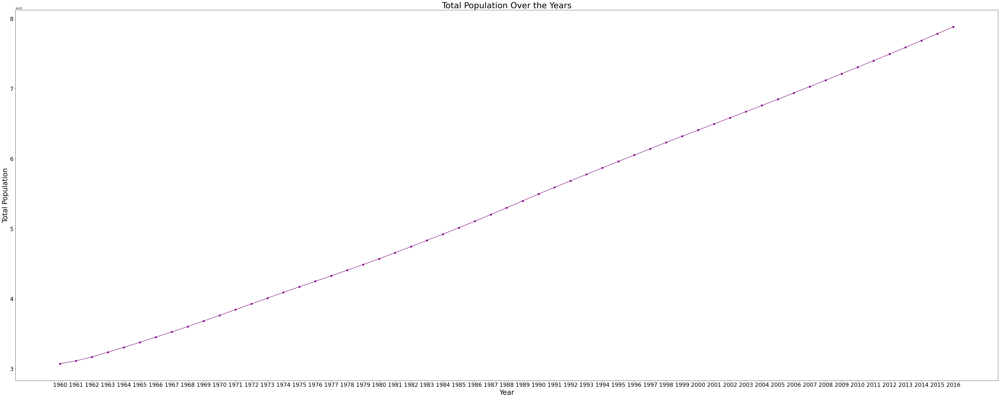

In [63]:
import matplotlib.pyplot as plt

plt.figure(figsize=(50, 20))  # Set the figure size


# Plotting the line graph for total population over years
plt.plot(pop_sum['Year'], pop_sum['Total Population'], marker='o', linestyle='-', color='purple')

# Setting title with increased font size
plt.title('Total Population Over the Years', fontsize=30)

# Setting x-axis and y-axis labels with increased font size
plt.xlabel('Year', fontsize=25)
plt.ylabel('Total Population', fontsize=25)

# Setting x-axis and y-axis ticks with increased font size
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.tight_layout()
plt.show()  # Displaying the plot


# Life expectancy variation

In [64]:
#storing the life_expectancy data in  temp_life variable
temp_life=life_expectancy_data
temp_life.head(2)

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,Aruba,ABW,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,65.66,66.07,66.44,66.79,67.11,67.44,...,74.58,74.72,74.87,75.02,75.16,75.30,75.44,75.58,75.72,75.87
1,Afghanistan,AFG,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,32.29,32.74,33.18,33.62,34.06,34.49,...,59.69,60.24,60.75,61.23,61.67,62.09,62.49,62.90,63.29,63.67


In [65]:
#Deleting the unwanted columns
temp_life.drop(['Country Name','Country Code','Indicator Name', 'Indicator Code'],axis =1, inplace = True)
new_life = temp_life.dropna()

In [66]:
#Displaying the new_life data
new_life.head()

,1960,1961,1962,1963,1964,1965,1966,1967,1968,1969,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,65.66,66.07,66.44,66.79,67.11,67.44,67.76,68.10,68.44,68.78,...,74.58,74.72,74.87,75.02,75.16,75.30,75.44,75.58,75.72,75.87
1,32.29,32.74,33.18,33.62,34.06,34.49,34.93,35.36,35.80,36.23,...,59.69,60.24,60.75,61.23,61.67,62.09,62.49,62.90,63.29,63.67
2,33.25,33.57,33.91,34.27,34.65,35.03,35.43,35.83,36.23,36.64,...,55.10,56.19,57.23,58.19,59.04,59.77,60.37,60.86,61.24,61.55
3,62.28,63.30,64.19,64.91,65.46,65.85,66.11,66.30,66.48,66.69,...,75.66,75.94,76.28,76.65,77.03,77.39,77.70,77.96,78.17,78.34
4,53.37,53.92,54.31,54.69,55.18,55.67,56.14,56.56,56.96,57.34,...,69.16,69.54,69.93,70.28,70.63,70.99,71.23,71.55,71.75,71.99


In [67]:
#Calculating the mean life_expectancy by year
life_mean =  new_life.mean()


In [68]:
#Converting life_mean to DataFrame
life_mean = pd.DataFrame(life_mean).reset_index()
life_mean.columns= ['Year', 'Life expectancy']

In [69]:
life_mean.head()

,Year,Life expectancy
0,1960,53.367311
1,1961,53.919848
2,1962,54.313220
3,1963,54.691402
4,1964,55.182992


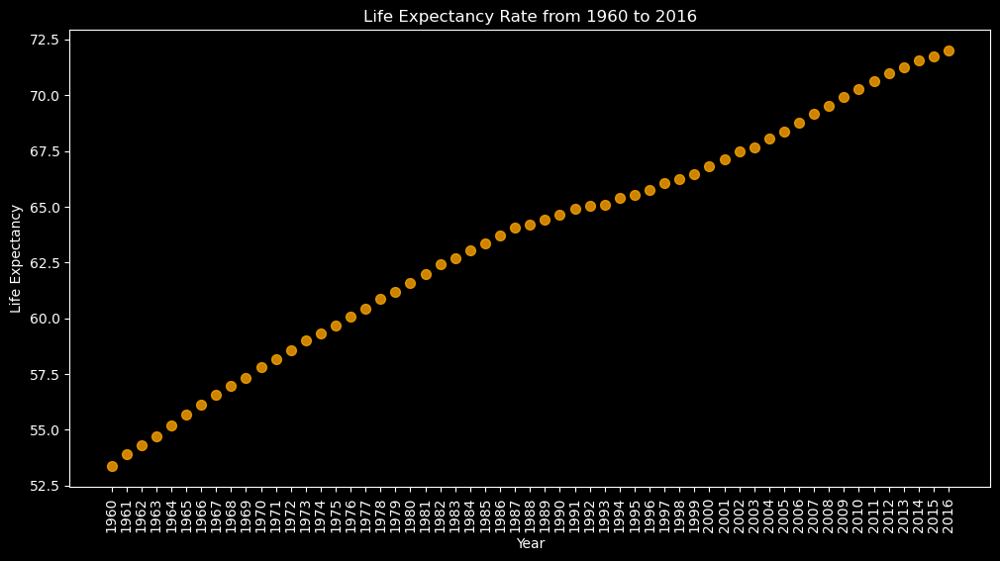

In [70]:
import matplotlib.pyplot as plt

# Activating the 'dark_background' style
plt.style.use('dark_background')

plt.figure(figsize=(12, 6))
plt.scatter(life_mean['Year'], life_mean['Life expectancy'], color='orange', s=50, alpha=0.8)
plt.xticks(rotation=90)
plt.title('Life Expectancy Rate from 1960 to 2016')
plt.xlabel('Year')
plt.ylabel('Life Expectancy')
plt.show()


In [71]:
# Saving the plot as an image file
plt.savefig('life_expectancy_scatter.png') 

<Figure size 640x480 with 0 Axes>

# Correlation Analysis

In [72]:
selected_columns = ['Life Expectancy', 'Fertility Rate', 'Population']
correlation_data = final_df[selected_columns]

# Calculating the Pearson correlation matrix
correlation_matrix = correlation_data.corr()

print(correlation_matrix)

                 Life Expectancy  Fertility Rate  Population
Life Expectancy         1.000000       -0.862794    0.028954
Fertility Rate         -0.862794        1.000000   -0.093295
Population              0.028954       -0.093295    1.000000


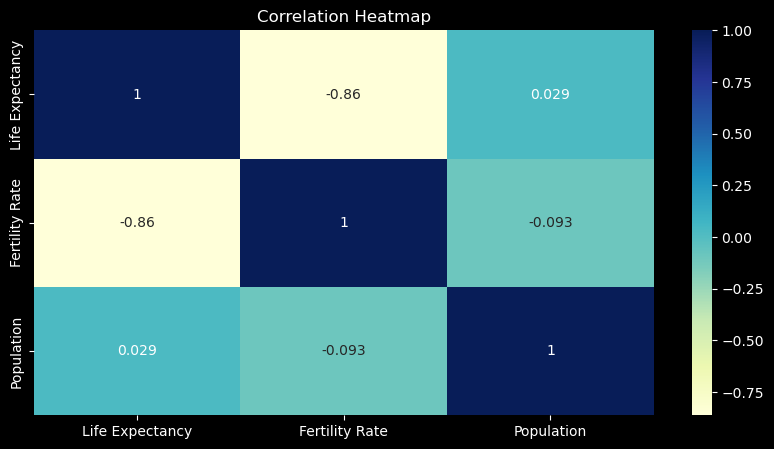

In [73]:
# Plotting the heatmap for correlation analysis

plt.figure(figsize=(10, 5))  
sns.heatmap(correlation_matrix, annot=True, cmap='YlGnBu')  
plt.title('Correlation Heatmap')
plt.show()

In [74]:
# Saving the heatmap as an image file (e.g., PNG, JPG, PDF, etc.)
plt.savefig('correlation_heatmap.png') 

<Figure size 640x480 with 0 Axes>

# Regional Analysis
 

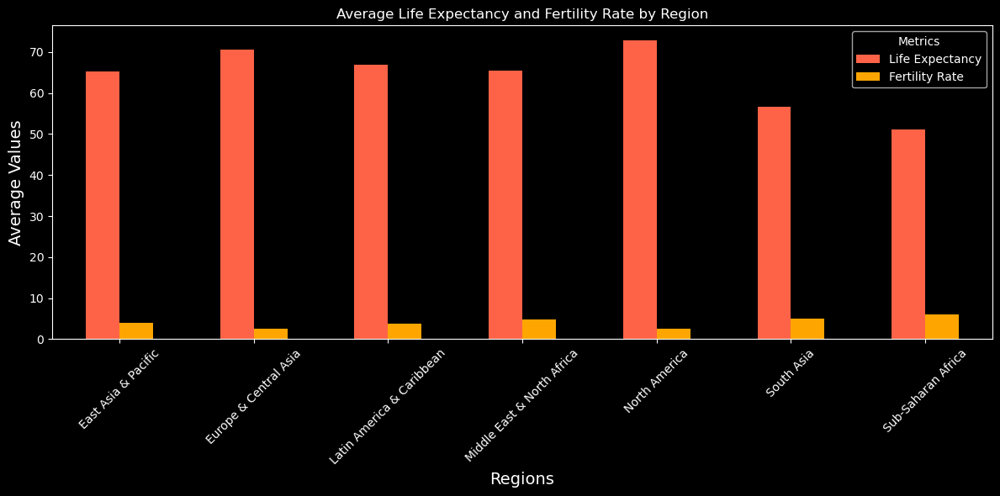

In [75]:
# Grouping the data by 'Region' and calculating the mean values
region_means = final_df.groupby('Region').mean()[['Life Expectancy', 'Fertility Rate']]


# Define custom colors for each bar
colors = ['#FF6347', '#FFA500']

# Plotting the bar chart and specifying colors
region_means.plot(kind='bar', figsize=(12, 6), color=colors)
plt.title('Average Life Expectancy and Fertility Rate by Region')
plt.xlabel('Regions',fontsize=14)
plt.ylabel('Average Values',fontsize=14)
plt.xticks(rotation=45)
plt.legend(title='Metrics')
plt.tight_layout()
plt.show()

In [76]:
# Saving the bar chart as an image file (e.g., PNG, JPG, PDF, etc.)
plt.savefig('region_means_bar_chart.png')

<Figure size 640x480 with 0 Axes>

# Population Trends Across regions -using Race Bar plot

In [77]:
# Creating subset_df with 'Region' column and setting the index to 'Year'
subset_df = final_df[['Region', 'Year', 'Population']].copy()
subset_df['Year'] = subset_df['Year'].astype(str)
subset_df.set_index('Year', inplace=True)



In [78]:
# Using pivot_table to reshape the DataFrame
subset_df = subset_df.pivot_table(values='Population', index='Year', columns='Region')
subset_df = subset_df.rename_axis(None, axis=1)
subset_df


,East Asia & Pacific,Europe & Central Asia,Latin America & Caribbean,Middle East & North Africa,North America,South Asia,Sub-Saharan Africa
Year,,,,,,,
1960,2.781980e+07,1.145358e+07,5.335814e+06,5.198010e+06,6.620814e+07,7.147946e+07,4.762208e+06
1961,2.790609e+07,1.158711e+07,5.483302e+06,5.338497e+06,6.733583e+07,7.298676e+07,4.875179e+06
1962,2.828631e+07,1.172556e+07,5.636593e+06,5.486930e+06,6.839953e+07,7.455174e+07,4.992649e+06
1963,2.897176e+07,1.186527e+07,5.794201e+06,5.639361e+06,6.941790e+07,7.617398e+07,5.114651e+06
1964,2.964731e+07,1.200371e+07,5.954542e+06,5.797430e+06,7.042097e+07,7.785283e+07,5.241175e+06
1965,3.035138e+07,1.213769e+07,6.116218e+06,5.959259e+06,7.134370e+07,7.958773e+07,5.372263e+06
1966,3.114807e+07,1.225406e+07,6.278672e+06,6.124287e+06,7.221967e+07,8.137954e+07,5.508045e+06
1967,3.191891e+07,1.236725e+07,6.442771e+06,6.297513e+06,7.305867e+07,8.322833e+07,5.648735e+06
1968,3.270054e+07,1.247611e+07,6.608961e+06,6.473026e+06,7.383433e+07,8.513186e+07,5.794562e+06


##  Note:The Race Bar Plot is shown clearly in the Output folder

In [79]:
import bar_chart_race as bcr

html=bcr.bar_chart_race(
     df=subset_df,
    filename=None,
    orientation='h',
    n_bars=10,
    steps_per_period=60,
    label_bars=True,
    period_length=1000,
    period_label={'x':.89,'y':.05},
    period_summary_func=lambda v, r: {'x': .5, 'y': .5,  # Center position
                                      's': 'Made by DivyaD',
                                      'ha': 'center', 'va': 'center',  # Center alignment
                                      'size': 10}, 
    figsize=(5,3),
    title='Population Trends Across Regions Over Specific Years',
    bar_label_size=7,
    tick_label_size=7,
    fig=None,
    
)
html

C:\Users\91638\AppData\Roaming\Python\Python39\site-packages\bar_chart_race\_make_chart.py:286: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\91638\AppData\Roaming\Python\Python39\site-packages\bar_chart_race\_make_chart.py:287: UserWarning:

FixedFormatter should only be used together with FixedLocator



#  Fertility rate distribution plot - using Choropleth map

In [80]:

fig = px.choropleth(
    final_df, 
    locations='Country Name',  # Column representing country names
    locationmode='country names',  # Using country names for location mode
    color='Fertility Rate',  # Column to be mapped (fertility rate)
    hover_name='Country Name',  # Hover data
    animation_frame='Year',  # Column representing animation frames
    title='Global Fertility Rate Dynamics by Country (Year-wise)',  # Plot title
    color_continuous_scale='Turbo',  # Color scale
    projection='natural earth'  # Map projection
)


# Updating figure layout for dark theme
fig.update_layout(
    template='plotly_dark',  # Use the dark theme
)

# Saving the animated choropleth map as an HTML file
fig.write_html('Global_fertility_choropleth.html')

# Show the animated choropleth map for fertility rate
fig.show()